# 연습

#### 패키지 불러오기

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
from sklearn.tree import export_graphviz
import graphviz

from subprocess import call
from IPython.display import Image


from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import accuracy_score, f1_score 
from sklearn.metrics import confusion_matrix, classification_report

In [5]:
import os
os.chdir("/home/piai/Desktop/git/2. Big Data 분석")
os.environ["PATH"] += os.pathsep + "/home/piai/anaconda3/lib/python3.10/site-packages"

#### 그래프 옵션 지정

In [6]:
matplotlib.rc("font", family = "NanumSquare")
matplotlib.rc("axes", unicode_minus = False)

### 데이터 구성하기

In [7]:
# 데이터 불러오기
df_raw = pd.read_csv("통신고객이탈.csv")
df_raw.head()

,CHURN,CUSTOMER_ID,GENDER,AGE,CHARGE_TYPE,HANDSET,USAGE_BAND,SERVICE_DURATION,DROPPED_CALLS,PEAK_CALLS_NO,PEAK_CALLS_TIME,WEEKEND_CALLS_NO,WEEKEND_CALLS_TIME,TOTAL_CALLS_NO,TOTAL_CALLS_TIME
0,Active,K102990,F,31,CAT 100,ASAD170,Med,33.33,6,218,379.8,9,21.6,366,632.4
1,Active,K103280,M,27,CAT 100,S50,Med,30.87,10,373,656.4,11,28.0,411,810.4
2,Active,K103660,M,27,CAT 100,ASAD170,Med,49.40,11,260,582.0,0,0.0,265,614.1
3,Active,K103730,M,61,CAT 100,ASAD170,Med,48.60,1,294,661.8,14,101.5,326,844.0
4,Active,K104560,F,52,CAT 100,S50,Med,56.03,0,221,555.6,7,25.0,274,673.0


In [11]:
df_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 930 entries, 0 to 929
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   CHURN               930 non-null    object 
 1   CUSTOMER_ID         930 non-null    object 
 2   GENDER              930 non-null    object 
 3   AGE                 930 non-null    int64  
 4   CHARGE_TYPE         930 non-null    object 
 5   HANDSET             930 non-null    object 
 6   USAGE_BAND          930 non-null    object 
 7   SERVICE_DURATION    930 non-null    float64
 8   DROPPED_CALLS       930 non-null    int64  
 9   PEAK_CALLS_NO       930 non-null    int64  
 10  PEAK_CALLS_TIME     930 non-null    float64
 11  WEEKEND_CALLS_NO    930 non-null    int64  
 12  WEEKEND_CALLS_TIME  930 non-null    float64
 13  TOTAL_CALLS_NO      930 non-null    int64  
 14  TOTAL_CALLS_TIME    930 non-null    float64
dtypes: float64(4), int64(5), object(6)
memory usage: 109.1+ K

In [12]:
df_raw.isnull().sum()

CHURN                 0
CUSTOMER_ID           0
GENDER                0
AGE                   0
CHARGE_TYPE           0
HANDSET               0
USAGE_BAND            0
SERVICE_DURATION      0
DROPPED_CALLS         0
PEAK_CALLS_NO         0
PEAK_CALLS_TIME       0
WEEKEND_CALLS_NO      0
WEEKEND_CALLS_TIME    0
TOTAL_CALLS_NO        0
TOTAL_CALLS_TIME      0
dtype: int64

In [13]:
df_raw.drop(['CUSTOMER_ID'], axis = 1, inplace = True)
df_raw['CHURN'].replace({'Churned': 1, 'Active': 0}, inplace = True)
df_raw

,CHURN,GENDER,AGE,CHARGE_TYPE,HANDSET,USAGE_BAND,SERVICE_DURATION,DROPPED_CALLS,PEAK_CALLS_NO,PEAK_CALLS_TIME,WEEKEND_CALLS_NO,WEEKEND_CALLS_TIME,TOTAL_CALLS_NO,TOTAL_CALLS_TIME
0,0,F,31,CAT 100,ASAD170,Med,33.33,6,218,379.8,9,21.6,366,632.4
1,0,M,27,CAT 100,S50,Med,30.87,10,373,656.4,11,28.0,411,810.4
2,0,M,27,CAT 100,ASAD170,Med,49.40,11,260,582.0,0,0.0,265,614.1
3,0,M,61,CAT 100,ASAD170,Med,48.60,1,294,661.8,14,101.5,326,844.0
4,0,F,52,CAT 100,S50,Med,56.03,0,221,555.6,7,25.0,274,673.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
925,1,M,19,Play 100,SOP10,Med,17.40,12,60,100.8,27,59.4,127,628.2
926,1,F,59,Play 100,SOP20,Med,17.37,15,82,130.2,12,25.8,357,650.7
927,1,F,33,Play 300,S50,Med,44.93,12,174,286.2,25,67.0,596,1039.0
928,1,F,25,Play 300,S50,Med,40.43,14,315,552.0,0,0.0,609,1188.3


### 범주형 설명변수 더미 변환

In [14]:
obj_cols = df_raw.select_dtypes("object").columns

for col in obj_cols:
    _n = len(df_raw[col].value_counts())
    print(col, ":", str(_n))

GENDER : 2
CHARGE_TYPE : 5
HANDSET : 11
USAGE_BAND : 6


In [15]:
df_raw_dummy = pd.get_dummies(df_raw)
df_raw_dummy.head()

,CHURN,AGE,SERVICE_DURATION,DROPPED_CALLS,PEAK_CALLS_NO,PEAK_CALLS_TIME,WEEKEND_CALLS_NO,WEEKEND_CALLS_TIME,TOTAL_CALLS_NO,TOTAL_CALLS_TIME,...,HANDSET_S80,HANDSET_SOP10,HANDSET_SOP20,HANDSET_WC95,USAGE_BAND_High,USAGE_BAND_Low,USAGE_BAND_Med,USAGE_BAND_MedHigh,USAGE_BAND_MedLow,USAGE_BAND_None
0,0,31,33.33,6,218,379.8,9,21.6,366,632.4,...,0,0,0,0,0,0,1,0,0,0
1,0,27,30.87,10,373,656.4,11,28.0,411,810.4,...,0,0,0,0,0,0,1,0,0,0
2,0,27,49.40,11,260,582.0,0,0.0,265,614.1,...,0,0,0,0,0,0,1,0,0,0
3,0,61,48.60,1,294,661.8,14,101.5,326,844.0,...,0,0,0,0,0,0,1,0,0,0
4,0,52,56.03,0,221,555.6,7,25.0,274,673.0,...,0,0,0,0,0,0,1,0,0,0


#### 데이터 분리/ 분할

In [16]:
df_raw_x = df_raw_dummy.drop("CHURN", axis = 1, inplace = False)
df_raw_y = df_raw_dummy["CHURN"] 

df_train_x, df_test_x, df_train_y, df_test_y = train_test_split(
    df_raw_x, df_raw_y, test_size = 0.3, random_state = 1234) 

print("분할 전 설명변수 데이터 :", df_raw_x.shape)
print("분할 후 설명변수 데이터 :Train", df_train_x.shape, "  Test",df_test_x.shape)

분할 전 설명변수 데이터 : (930, 33)
분할 후 설명변수 데이터 :Train (651, 33)   Test (279, 33)


In [17]:
display(df_raw.head(10))
display(df_raw_x.head(10))

,CHURN,GENDER,AGE,CHARGE_TYPE,HANDSET,USAGE_BAND,SERVICE_DURATION,DROPPED_CALLS,PEAK_CALLS_NO,PEAK_CALLS_TIME,WEEKEND_CALLS_NO,WEEKEND_CALLS_TIME,TOTAL_CALLS_NO,TOTAL_CALLS_TIME
0,0,F,31,CAT 100,ASAD170,Med,33.33,6,218,379.8,9,21.6,366,632.4
1,0,M,27,CAT 100,S50,Med,30.87,10,373,656.4,11,28.0,411,810.4
2,0,M,27,CAT 100,ASAD170,Med,49.40,11,260,582.0,0,0.0,265,614.1
3,0,M,61,CAT 100,ASAD170,Med,48.60,1,294,661.8,14,101.5,326,844.0
4,0,F,52,CAT 100,S50,Med,56.03,0,221,555.6,7,25.0,274,673.0
5,0,M,51,CAT 100,S80,Med,49.43,3,289,486.6,1,31.8,427,903.3
6,0,F,30,CAT 100,ASAD170,Med,32.30,6,427,729.6,12,52.8,490,907.2
7,0,M,36,CAT 100,ASAD170,Med,54.87,2,522,801.6,0,0.0,558,884.7
8,0,F,43,CAT 100,S50,Med,11.23,0,156,516.6,8,84.0,362,987.6
9,0,F,50,CAT 100,ASAD170,Med,49.97,0,136,466.2,13,31.8,186,632.7


,AGE,SERVICE_DURATION,DROPPED_CALLS,PEAK_CALLS_NO,PEAK_CALLS_TIME,WEEKEND_CALLS_NO,WEEKEND_CALLS_TIME,TOTAL_CALLS_NO,TOTAL_CALLS_TIME,GENDER_F,...,HANDSET_S80,HANDSET_SOP10,HANDSET_SOP20,HANDSET_WC95,USAGE_BAND_High,USAGE_BAND_Low,USAGE_BAND_Med,USAGE_BAND_MedHigh,USAGE_BAND_MedLow,USAGE_BAND_None
0,31,33.33,6,218,379.8,9,21.6,366,632.4,1,...,0,0,0,0,0,0,1,0,0,0
1,27,30.87,10,373,656.4,11,28.0,411,810.4,0,...,0,0,0,0,0,0,1,0,0,0
2,27,49.40,11,260,582.0,0,0.0,265,614.1,0,...,0,0,0,0,0,0,1,0,0,0
3,61,48.60,1,294,661.8,14,101.5,326,844.0,0,...,0,0,0,0,0,0,1,0,0,0
4,52,56.03,0,221,555.6,7,25.0,274,673.0,1,...,0,0,0,0,0,0,1,0,0,0
5,51,49.43,3,289,486.6,1,31.8,427,903.3,0,...,1,0,0,0,0,0,1,0,0,0
6,30,32.30,6,427,729.6,12,52.8,490,907.2,1,...,0,0,0,0,0,0,1,0,0,0
7,36,54.87,2,522,801.6,0,0.0,558,884.7,0,...,0,0,0,0,0,0,1,0,0,0
8,43,11.23,0,156,516.6,8,84.0,362,987.6,1,...,0,0,0,0,0,0,1,0,0,0
9,50,49.97,0,136,466.2,13,31.8,186,632.7,1,...,0,0,0,0,0,0,1,0,0,0


In [18]:
# Data 구조 확인
print("Data 구조:", df_raw_x.columns)
print()
print("변수 : ", df_train_x.columns)

Data 구조: Index(['AGE', 'SERVICE_DURATION', 'DROPPED_CALLS', 'PEAK_CALLS_NO',
       'PEAK_CALLS_TIME', 'WEEKEND_CALLS_NO', 'WEEKEND_CALLS_TIME',
       'TOTAL_CALLS_NO', 'TOTAL_CALLS_TIME', 'GENDER_F', 'GENDER_M',
       'CHARGE_TYPE_CAT 100', 'CHARGE_TYPE_CAT 200', 'CHARGE_TYPE_CAT 50',
       'CHARGE_TYPE_Play 100', 'CHARGE_TYPE_Play 300', 'HANDSET_ASAD170',
       'HANDSET_ASAD90', 'HANDSET_BS110', 'HANDSET_BS210', 'HANDSET_CAS30',
       'HANDSET_CAS60', 'HANDSET_S50', 'HANDSET_S80', 'HANDSET_SOP10',
       'HANDSET_SOP20', 'HANDSET_WC95', 'USAGE_BAND_High', 'USAGE_BAND_Low',
       'USAGE_BAND_Med', 'USAGE_BAND_MedHigh', 'USAGE_BAND_MedLow',
       'USAGE_BAND_None'],
      dtype='object')

변수 :  Index(['AGE', 'SERVICE_DURATION', 'DROPPED_CALLS', 'PEAK_CALLS_NO',
       'PEAK_CALLS_TIME', 'WEEKEND_CALLS_NO', 'WEEKEND_CALLS_TIME',
       'TOTAL_CALLS_NO', 'TOTAL_CALLS_TIME', 'GENDER_F', 'GENDER_M',
       'CHARGE_TYPE_CAT 100', 'CHARGE_TYPE_CAT 200', 'CHARGE_TYPE_CAT 50',
       'C

### @불균형 자료 사전 처리:over-, under-sampling-SMOTE

class imblearn.over_sampling.SMOTE(*, sampling_strategy='auto', random_state=None, k_neighbors=5, n_jobs=None)


In [19]:
!pip install imblearn

In [20]:
# 샘플링 : Over-sampling 등
from imblearn.over_sampling import SMOTE

In [22]:
# 목표변수 빈도 확인
print(df_raw.value_counts(["CHURN"]),"\n")
print("CHURN=1 비율  ", df_raw.value_counts(df_raw["CHURN"]==1)/len(df_raw))

CHURN
0        750
1        180
dtype: int64 

CHURN=1 비율   CHURN
False    0.806452
True     0.193548
dtype: float64


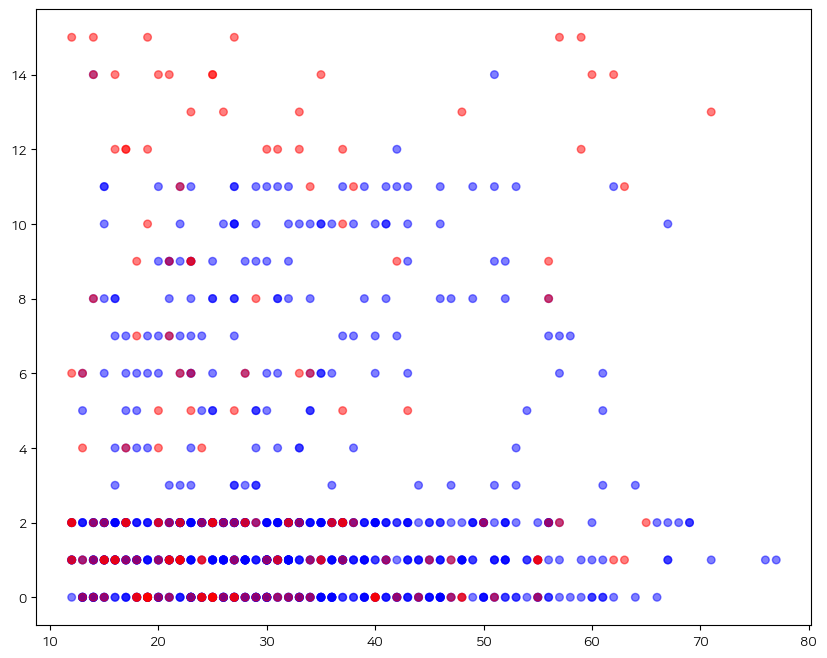

In [91]:
plt.figure(figsize=(10,8))

df_raw['color'] = np.where(df_raw["CHURN"]==1, "red", "blue")
# plt.scatter(df_raw['LOAN'],df_raw['VALUE'],c=df_raw['BAD'], s=30, alpha=0.5)
plt.scatter(df_raw['AGE'],df_raw['DROPPED_CALLS'],c=df_raw['color'], s=30, alpha=0.5)

plt.show()

In [92]:
sm = SMOTE(sampling_strategy='auto', random_state=1234)

x_resampled, y_resampled = sm.fit_resample(df_train_x,df_train_y)

print('Over-Sampling 전:\n',df_train_y.value_counts(),"\n")
print('Over-Sampling 후 Train X: {}'.format(x_resampled.shape))
print('Over-Sampling 후 Train Y: {} \n'.format(y_resampled.shape))

print("Over-Sampling 후 '1':{}".format(sum(y_resampled==1)))
print("Over-Sampling 후 '0':{}".format(sum(y_resampled==0)))

Over-Sampling 전:
 0    515
1    136
Name: CHURN, dtype: int64 

Over-Sampling 후 Train X: (1030, 33)
Over-Sampling 후 Train Y: (1030,) 

Over-Sampling 후 '1':515
Over-Sampling 후 '0':515


   AGE  SERVICE_DURATION  DROPPED_CALLS  PEAK_CALLS_NO  PEAK_CALLS_TIME  \
0   40             36.00              2            556           1436.4   
1   41             45.33             11             73            403.2   
2   26             55.07              0            546           1228.2   
3   24             50.83              2            249            445.2   
4   32             55.63             10            125            232.2   

   WEEKEND_CALLS_NO  WEEKEND_CALLS_TIME  TOTAL_CALLS_NO  TOTAL_CALLS_TIME  \
0                 8                74.0             736            1862.9   
1                15                39.0             204             962.4   
2                 0                 0.0             588            1294.8   
3                 6                15.0             274             527.1   
4                 4               112.8             159             525.9   

   GENDER_F  ...  HANDSET_SOP10  HANDSET_SOP20  HANDSET_WC95  USAGE_BAND_High  \
0    

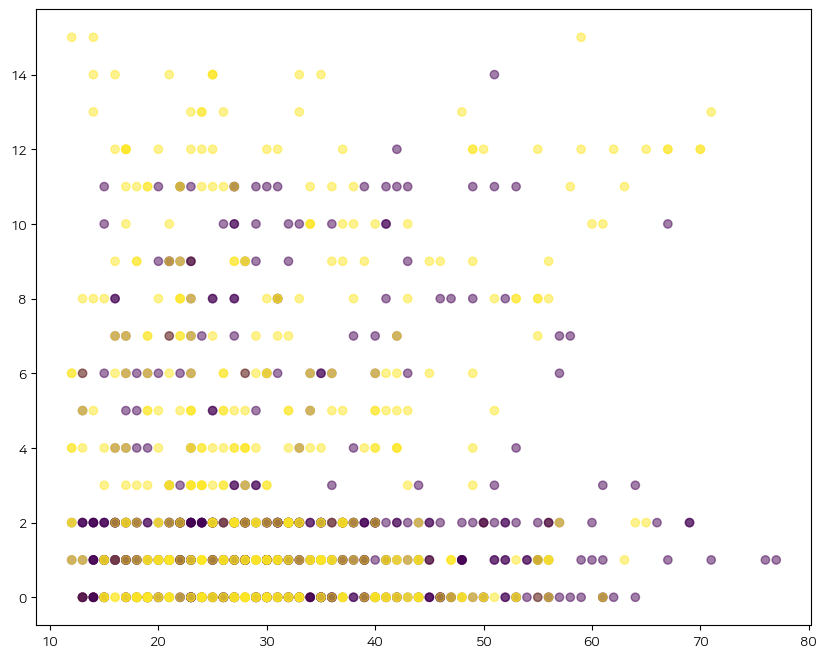

In [93]:
df_resampled = pd.concat([x_resampled,y_resampled], axis=1)
print(df_resampled.head())

# 목표변수 산점도 확인:위와 다른 방식으로 색깔 구분
plt.figure(figsize=(10,8))
plt.scatter(df_resampled['AGE'],df_resampled['DROPPED_CALLS'],
            c=df_resampled['CHURN'],alpha=0.5)
plt.show()

## 모델 생성

### Default option Moel

In [35]:
tree_uncust = DecisionTreeClassifier(random_state=1234 )
tree_uncust.fit(df_train_x, df_train_y)

os.environ["PATH"] += os.pathsep + "/home/piai/anaconda3/lib/python3.10/site-packages
print("Accuracy on training set: {:.3f}".format(tree_uncust.score(df_train_x, df_train_y)))
print("Accuracy on test set: {:.3f}".format(tree_uncust.score(df_test_x, df_test_y)))

Accuracy on training set: 1.000
Accuracy on test set: 0.853


In [36]:
print(tree_uncust.get_params().keys())
print(tree_uncust.get_params().values())

dict_keys(['ccp_alpha', 'class_weight', 'criterion', 'max_depth', 'max_features', 'max_leaf_nodes', 'min_impurity_decrease', 'min_samples_leaf', 'min_samples_split', 'min_weight_fraction_leaf', 'random_state', 'splitter'])
dict_values([0.0, None, 'gini', None, None, None, 0.0, 1, 2, 0.0, 1234, 'best'])


### @max_depth(최대 깊이) 변화에 따른 모델 성능

In [37]:
train_accuracy = []; test_accuracy = []

para_depth = [depth for depth in range(3, 12)]

for v_max_depth in para_depth:
    tree = DecisionTreeClassifier(max_depth = v_max_depth, random_state=1234)
    tree.fit(df_train_x, df_train_y)
    train_accuracy.append(tree.score(df_train_x, df_train_y))
    test_accuracy.append(tree.score(df_test_x, df_test_y))

df_accuracy_depth = pd.DataFrame()
df_accuracy_depth["Depth"] = para_depth
df_accuracy_depth["TrainAccuracy"] = train_accuracy
df_accuracy_depth["TestAccuracy"] = test_accuracy

In [38]:
para_depth

[3, 4, 5, 6, 7, 8, 9, 10, 11]

In [39]:
df_accuracy_depth.round(3)

,Depth,TrainAccuracy,TestAccuracy
0,3,0.889,0.910
1,4,0.892,0.910
2,5,0.920,0.903
3,6,0.931,0.875
4,7,0.951,0.860
5,8,0.959,0.842
6,9,0.963,0.853
7,10,0.972,0.857
8,11,0.980,0.857


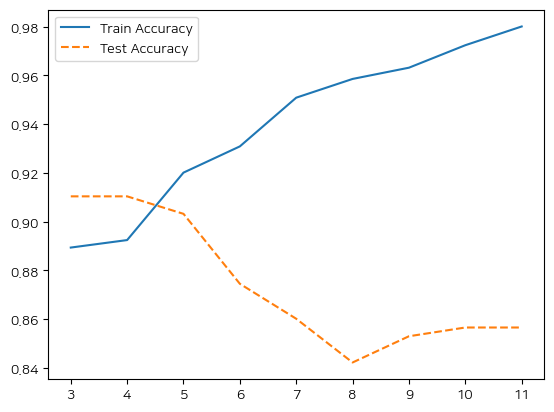

In [40]:
plt.plot(para_depth, train_accuracy, linestyle = "-", label = "Train Accuracy")
plt.plot(para_depth, test_accuracy, linestyle = "--", label = "Test Accuracy")
plt.legend()

In [41]:
v_feature_name = df_train_x.columns

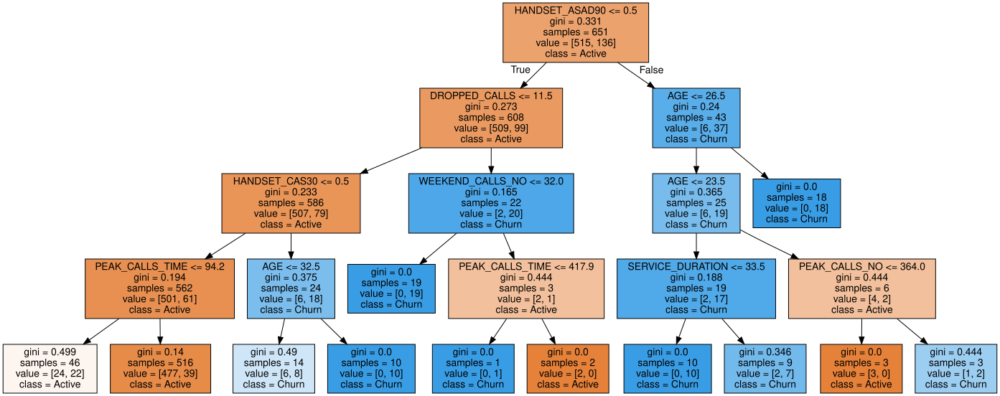

In [43]:
tree_low = DecisionTreeClassifier(max_depth = 4, random_state=1234)
tree_low.fit(df_train_x, df_train_y)

export_graphviz(tree_low, out_file="tree_low.dot", class_names = ["Active", "Churn"], 
                feature_names = v_feature_name, impurity = True, filled = True)

with open("tree_low.dot") as f:
    dot_graph = f.read()
display(graphviz.Source(dot_graph))

In [44]:
call(['dot', '-Tpng', 'tree_low.dot', '-o', 'tree_low.png', '-Gdpi=600'])
Image(filename = 'tree_low.png')

In [45]:
print("전체 자료 = ", df_train_x.shape[0],"개")
print("전체 자료의 1% = ", df_train_x.shape[0] * 0.01,"개")

전체 자료 =  651 개
전체 자료의 1% =  6.51 개


In [50]:
train_accuracy = []; test_accuracy = []
para_split = [n_split for n_split in range(2, 100)]

for v_min_samples_split in para_split:
    tree = DecisionTreeClassifier(min_samples_split = v_min_samples_split, max_depth=4, random_state=1234)
    tree.fit(df_train_x, df_train_y)
    train_accuracy.append(tree.score(df_train_x, df_train_y))
    test_accuracy.append(tree.score(df_test_x, df_test_y))

df_accuracy_split = pd.DataFrame()
df_accuracy_split["MinSamplesSplit"] = para_split
df_accuracy_split["TrainAccuracy"] = train_accuracy
df_accuracy_split["TestAccuracy"] = test_accuracy

In [52]:
df_accuracy_split.round(3)

,MinSamplesSplit,TrainAccuracy,TestAccuracy
0,2,0.892,0.910
1,3,0.892,0.910
2,4,0.891,0.910
3,5,0.891,0.910
4,6,0.891,0.910
...,...,...,...
93,95,0.885,0.914
94,96,0.885,0.914
95,97,0.885,0.914
96,98,0.885,0.914


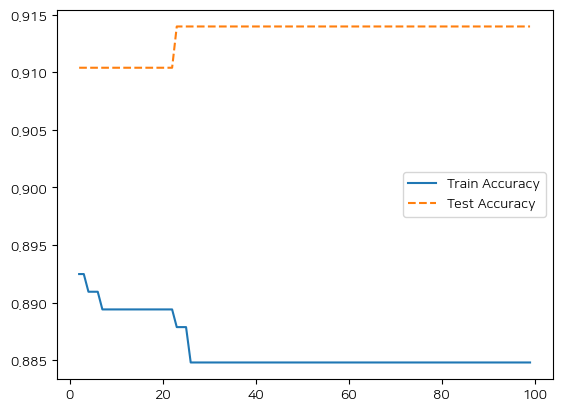

In [53]:
plt.plot(para_split, train_accuracy, linestyle = "-", label = "Train Accuracy")
plt.plot(para_split, test_accuracy, linestyle = "--", label = "Test Accuracy")
plt.legend()

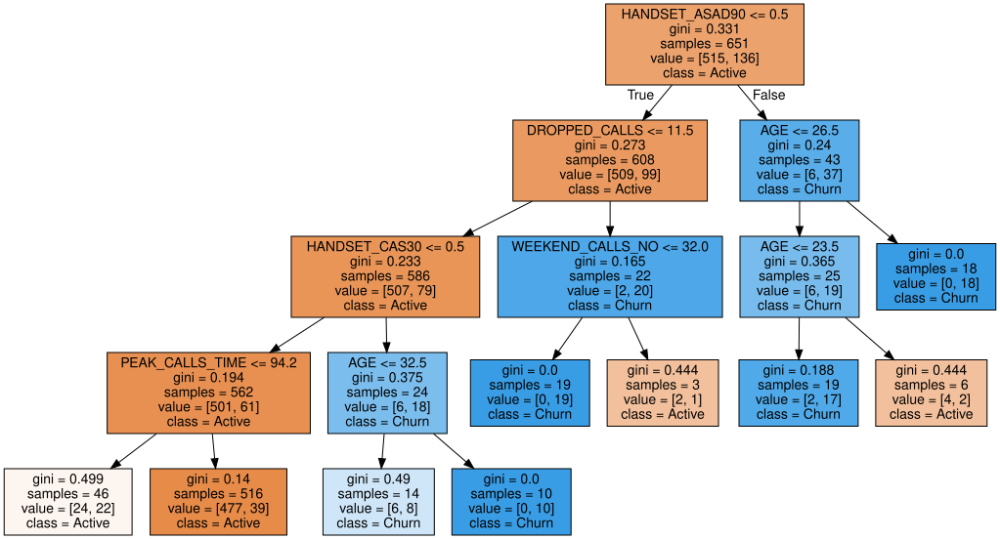

In [54]:
# 분리 노드의 최소 자료 수:적은 모델
tree_low = DecisionTreeClassifier(max_depth=4, min_samples_split=20, random_state=1234)
tree_low.fit(df_train_x, df_train_y)

export_graphviz(tree_low, out_file="tree_low.dot", class_names = ["Active", "Churn"],
                feature_names = v_feature_name, impurity = True, filled = True)

with open("tree_low.dot") as f:
    dot_graph = f.read()
display(graphviz.Source(dot_graph))

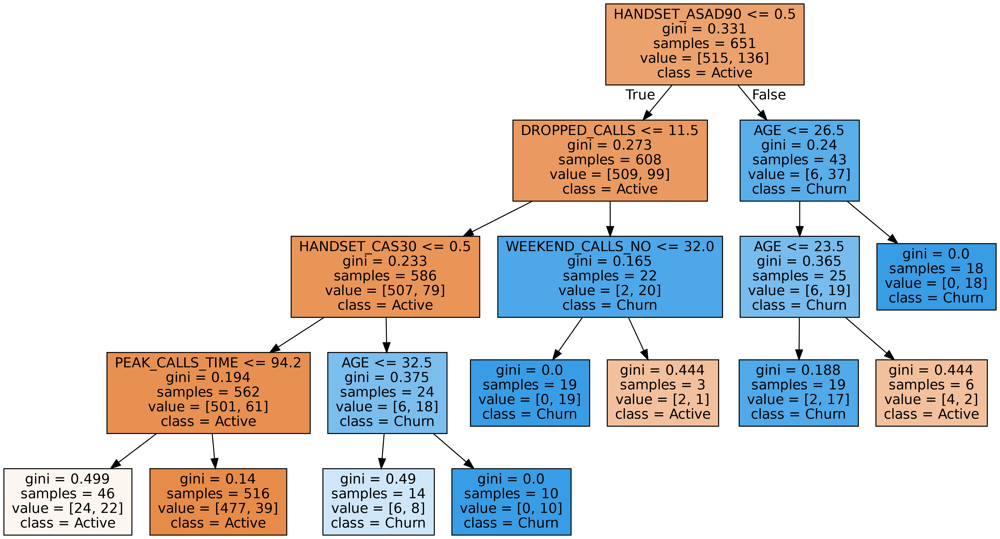

In [55]:
call(['dot', '-Tpng', 'tree_low.dot', '-o', 'tree_low.png', '-Gdpi=600'])
Image(filename = 'tree_low.png')

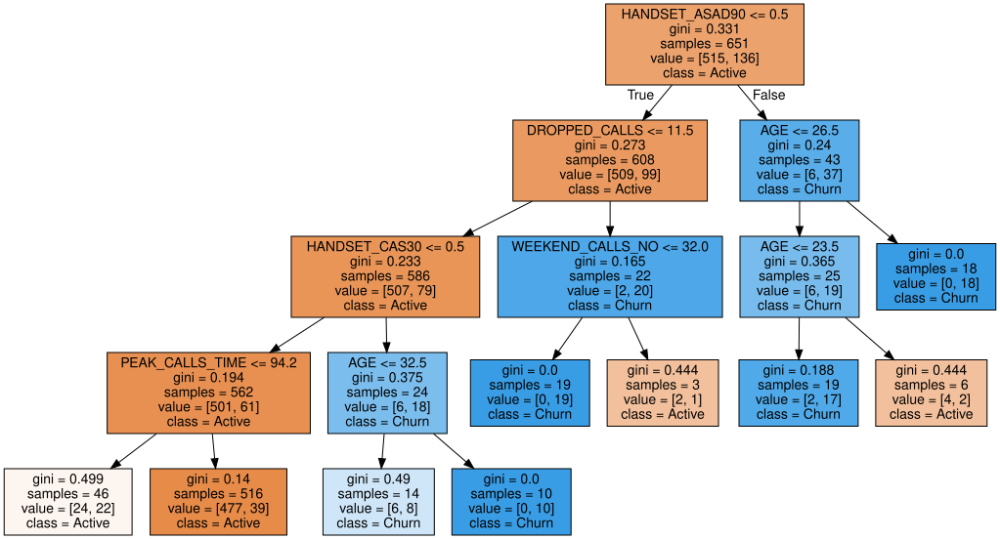

In [57]:
# 분리 노드의 최소 자료 수: 많은 모델
tree_high = DecisionTreeClassifier(max_depth=4, min_samples_split=20, random_state=1234)
tree_high.fit(df_train_x, df_train_y)

export_graphviz(tree_high, out_file="tree_high.dot", class_names = ["Active", "Churn"],
                feature_names = v_feature_name, impurity = True, filled = True)

with open("tree_high.dot") as f:
    dot_graph = f.read()
display(graphviz.Source(dot_graph))

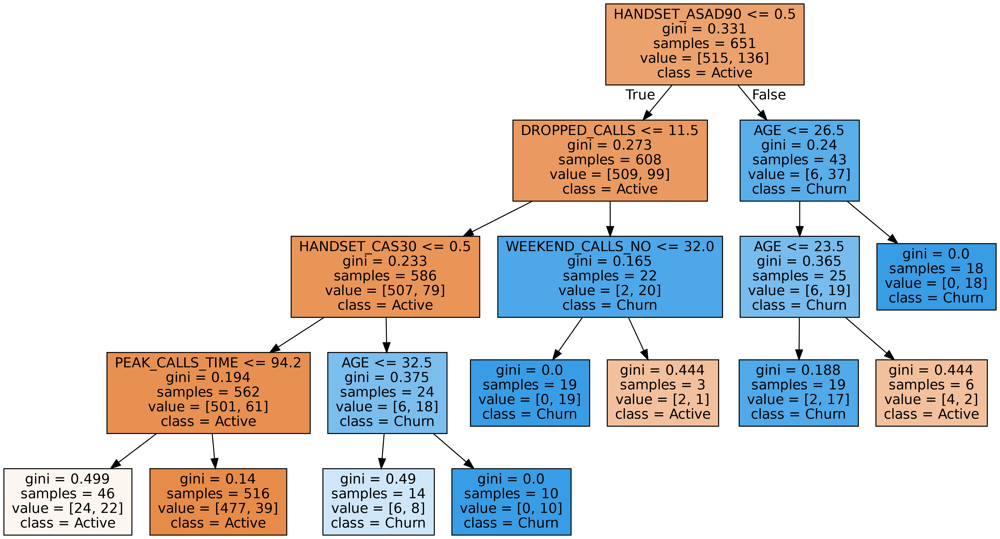

In [58]:
# 생성된 .dot 파일을 .png로 변환
call(['dot', '-Tpng', 'tree_high.dot', '-o', 'tree_high.png', '-Gdpi=600'])
# jupyter notebook에서 작업디렉토리에 있는 .png 직접 출력
Image(filename = 'tree_high.png')

In [59]:
# train 및 test 정확도 결과 저장용
train_accuracy = []; test_accuracy = []
# min_samples_leaf: 잎사귀 노드 최소 자료 수. 
para_leaf = [n_leaf for n_leaf in range(1,40)]

for v_min_samples_leaf in para_leaf:
    tree = DecisionTreeClassifier(min_samples_leaf = v_min_samples_leaf, min_samples_split=50, \
        max_depth=7, random_state=1234)
    tree.fit(df_train_x, df_train_y)
    train_accuracy.append(tree.score(df_train_x, df_train_y))
    test_accuracy.append(tree.score(df_test_x, df_test_y))

df_accuracy_leaf = pd.DataFrame()
df_accuracy_leaf["MinSamplesLeaf"] = para_leaf
df_accuracy_leaf["TrainAccuracy"] = train_accuracy
df_accuracy_leaf["TestAccuracy"] = test_accuracy

In [ ]:
# 모델 정확도 확인
df_accuracy_leaf.round(3)

,MinSamplesLeaf,TrainAccuracy,TestAccuracy
0,1,0.889,0.892
1,2,0.886,0.896
2,3,0.886,0.896
3,4,0.885,0.914
4,5,0.885,0.914
5,6,0.885,0.914
6,7,0.885,0.914
7,8,0.885,0.914
8,9,0.885,0.914
9,10,0.885,0.914


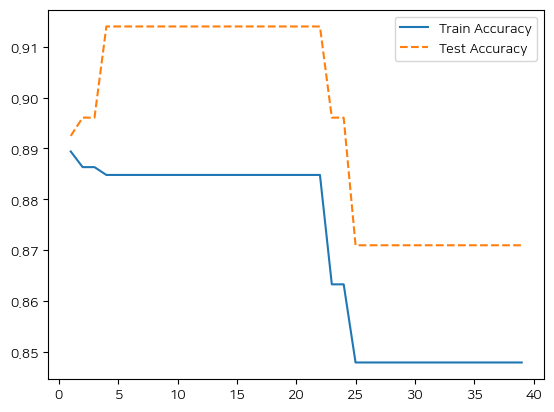

In [62]:
# 모델 정확도 그래프 확인
plt.plot(para_leaf, train_accuracy, linestyle = "-", label = "Train Accuracy")
plt.plot(para_leaf, test_accuracy, linestyle = "--", label = "Test Accuracy")
plt.legend()

##### @해석 : 10 초과 ->모델 정확도가 급격히 감소됨

#### 잎사귀 노드의 샘플 수(min_samples_leaf)에 따른 차이

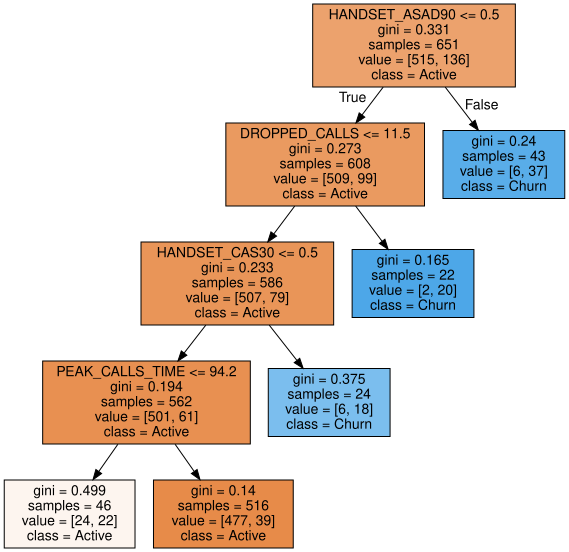

In [63]:
# 잎사귀의 최소 자료 수가 8인 모델
tree_low = DecisionTreeClassifier(max_depth=4, min_samples_split=20, min_samples_leaf=22, random_state=1234)
tree_low.fit(df_train_x, df_train_y)

export_graphviz(tree_low, out_file=" tree_low.dot", class_names = ["Active", "Churn"],
                feature_names = v_feature_name, impurity = True, filled = True)

with open(" tree_low.dot") as f:
    dot_graph = f.read()
display(graphviz.Source(dot_graph))

In [64]:
# 생성된 .dot 파일을 .png로 변환
call(['dot', '-Tpng', 'tree_low.dot', '-o', 'tree_low.png', '-Gdpi=600'])
# jupyter notebook에서 작업디렉토리에 있는 .png 직접 출력
Image(filename = 'tree_low.png')

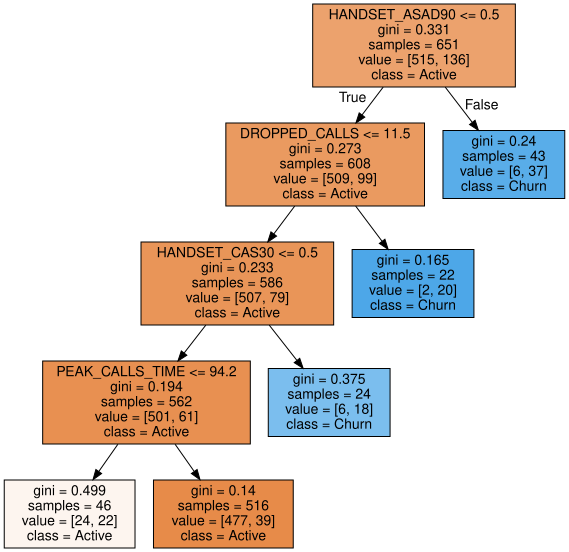

In [65]:
# 잎사귀의 최소 자료 수가 10인 모델
tree_high = DecisionTreeClassifier(max_depth=4, min_samples_split=20, min_samples_leaf=22, random_state=1234)
tree_high.fit(df_train_x, df_train_y)

export_graphviz(tree_high, out_file="tree_high.dot", class_names = ["Active", "Churn"],
                feature_names = v_feature_name, impurity = True, filled = True)

with open("tree_high.dot") as f:
    dot_graph = f.read()
display(graphviz.Source(dot_graph))

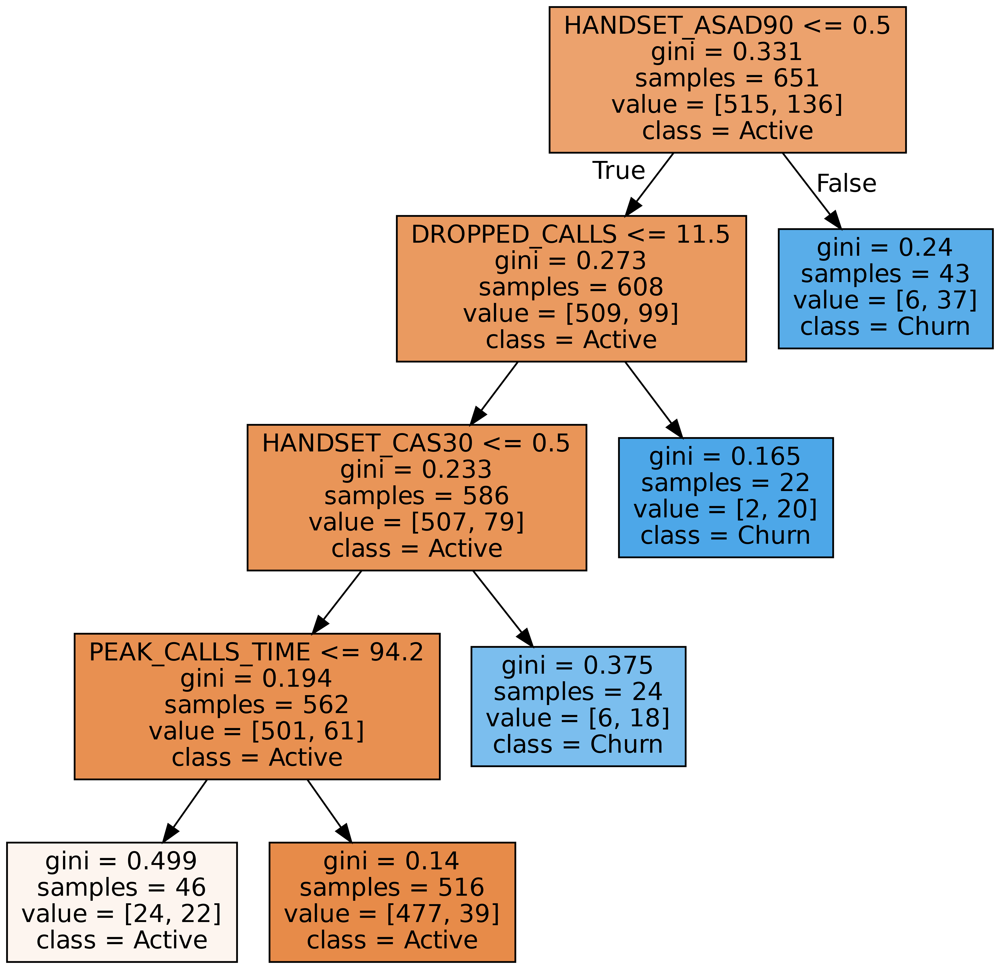

In [66]:
# 생성된 .dot 파일을 .png로 변환
call(['dot', '-Tpng', 'tree_high.dot', '-o', 'tree_high.png', '-Gdpi=600'])
# jupyter notebook에서 작업디렉토리에 있는 .png 직접 출력
Image(filename = 'tree_high.png')

## 최종 모델 선정 / 시각화

#### 최종 모델:분석가 판단에 따라 변경 가능

In [68]:
tree_final = DecisionTreeClassifier(max_depth=4, min_samples_split=20, min_samples_leaf=22, random_state=1234)
tree_final.fit(df_train_x, df_train_y)

DecisionTreeClassifier(max_depth=4, min_samples_leaf=22, min_samples_split=20,
                       random_state=1234)

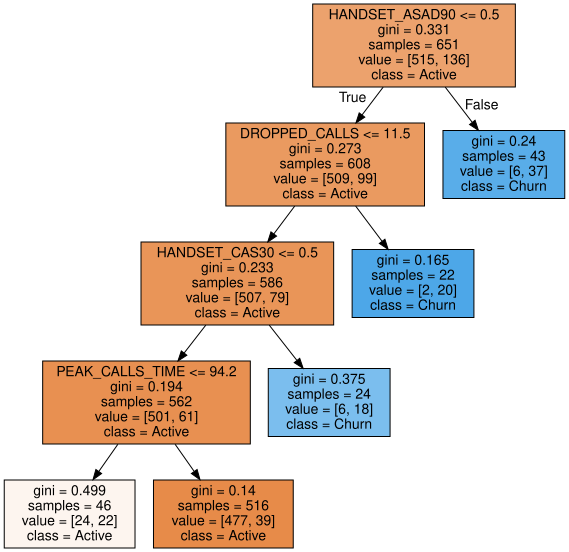

In [70]:
export_graphviz(tree_final, out_file="tree_final.dot", class_names = ["Active", "Churn"],
                feature_names = v_feature_name, impurity = True, filled = True)

with open("tree_final.dot") as f:
    dot_graph = f.read()
display(graphviz.Source(dot_graph))

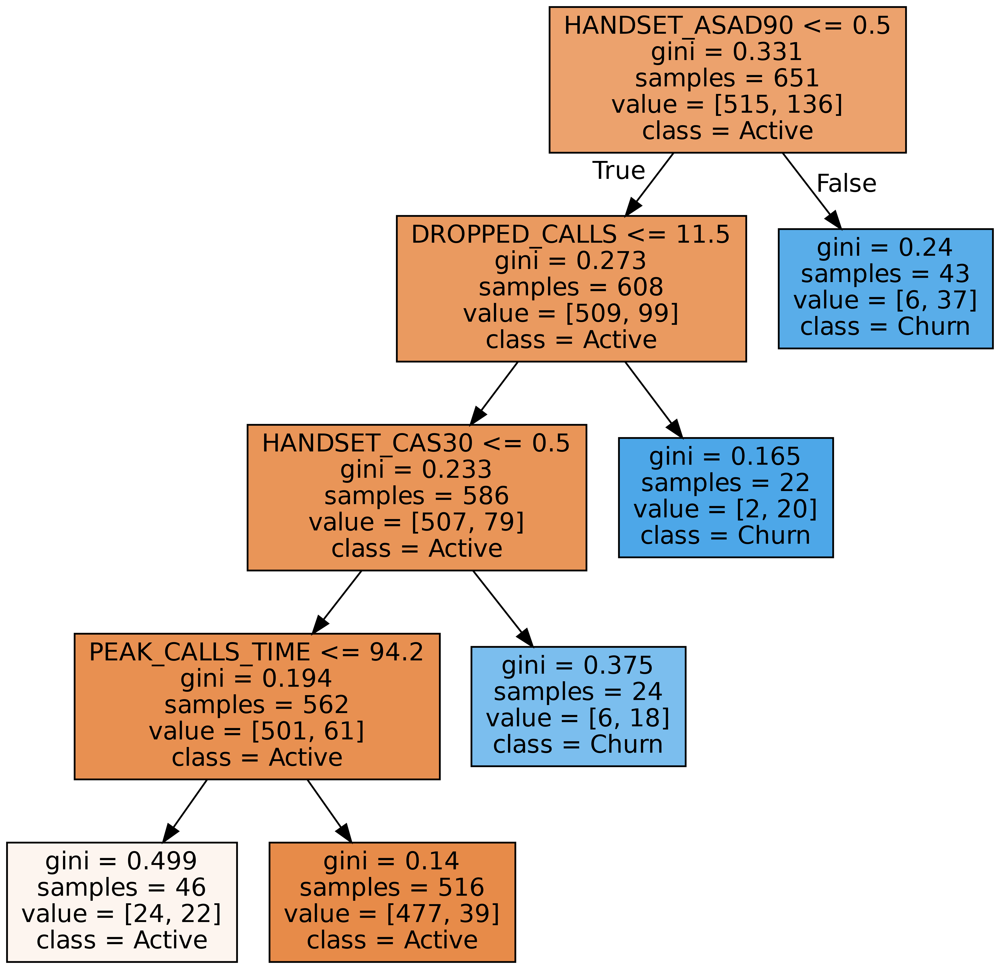

In [72]:
# 생성된 .dot 파일을 .png로 변환
call(['dot', '-Tpng', 'tree_final.dot', '-o', 'tree_final.png', '-Gdpi=600'])
# jupyter notebook에서 작업디렉토리에 있는 .png 직접 출력
Image(filename = 'tree_final.png')

In [73]:
# 평가
y_pred = tree_final.predict(df_test_x)
print("Test Accuracy: {0:.3f}\n".format(tree_final.score(df_test_x, df_test_y)))
print("Test Confusion matrix: \n{}".format(confusion_matrix(df_test_y, y_pred)))

# 목표변수의 빈도 불균형 : f1 score로 모델 평가 
print(classification_report(df_test_y, y_pred, digits=3))

Test Accuracy: 0.914

Test Confusion matrix: 
[[228   7]
 [ 17  27]]
              precision    recall  f1-score   support

           0      0.931     0.970     0.950       235
           1      0.794     0.614     0.692        44

    accuracy                          0.914       279
   macro avg      0.862     0.792     0.821       279
weighted avg      0.909     0.914     0.909       279



In [74]:
df_importance = pd.DataFrame()
df_importance["Feature"] = v_feature_name
df_importance["Importance"] = tree_final.feature_importances_

df_importance.sort_values("Importance", ascending=False, inplace = True)
df_importance.round(3)

,Feature,Importance
17,HANDSET_ASAD90,0.402
2,DROPPED_CALLS,0.262
20,HANDSET_CAS30,0.195
4,PEAK_CALLS_TIME,0.141
25,HANDSET_SOP20,0.000
19,HANDSET_BS210,0.000
21,HANDSET_CAS60,0.000
22,HANDSET_S50,0.000
23,HANDSET_S80,0.000
24,HANDSET_SOP10,0.000


Text(0, 0.5, '설명변수')

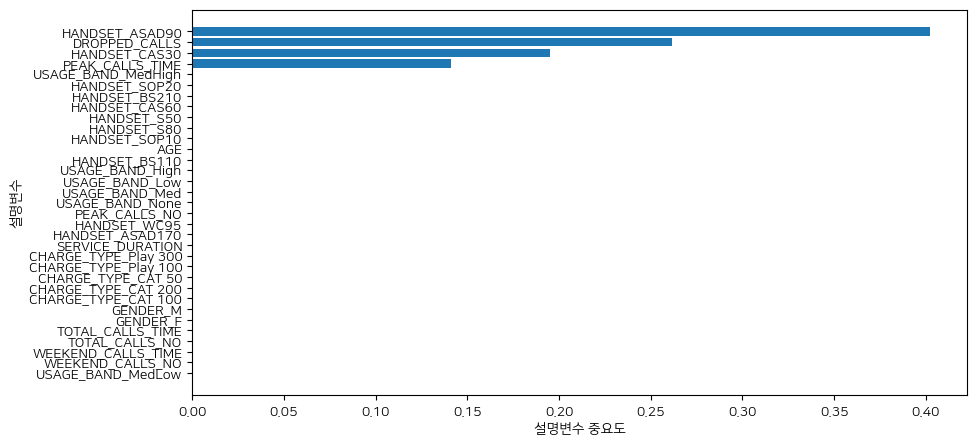

In [75]:
df_importance.sort_values("Importance", ascending=True, inplace = True)
coordinates = range(len(df_importance))

plt.figure(figsize=(10,5))
plt.barh(y = coordinates, width = df_importance["Importance"])
plt.yticks(coordinates, df_importance["Feature"])
plt.xlabel("설명변수 중요도")

plt.ylabel("설명변수")

#### 참고: 분리기준 변경 및 결과 확인

In [76]:
tree_final2 = DecisionTreeClassifier(criterion='entropy', max_depth=7, min_samples_split=50, min_samples_leaf=14, random_state=1234)
tree_final2.fit(df_train_x, df_train_y)

DecisionTreeClassifier(criterion='entropy', max_depth=7, min_samples_leaf=14,
                       min_samples_split=50, random_state=1234)

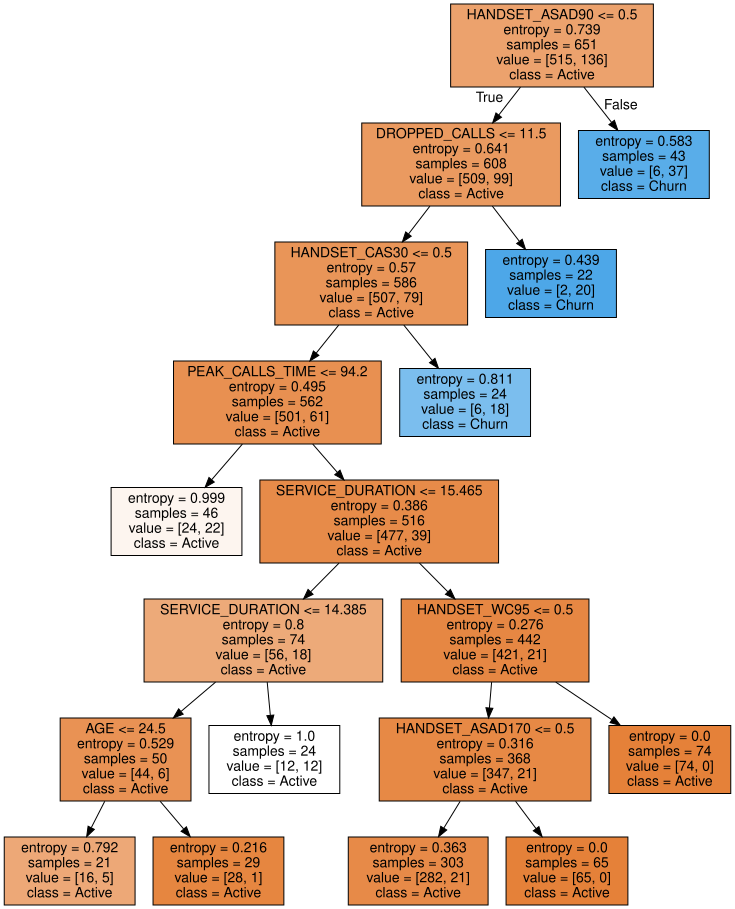

In [77]:
# tree_final.dot으로 결과 저장
export_graphviz(tree_final2, out_file="tree_final2.dot", class_names = ["Active", "Churn"],
                feature_names = v_feature_name, impurity = True, filled = True)

with open("tree_final2.dot") as f:
    dot_graph = f.read()
display(graphviz.Source(dot_graph))

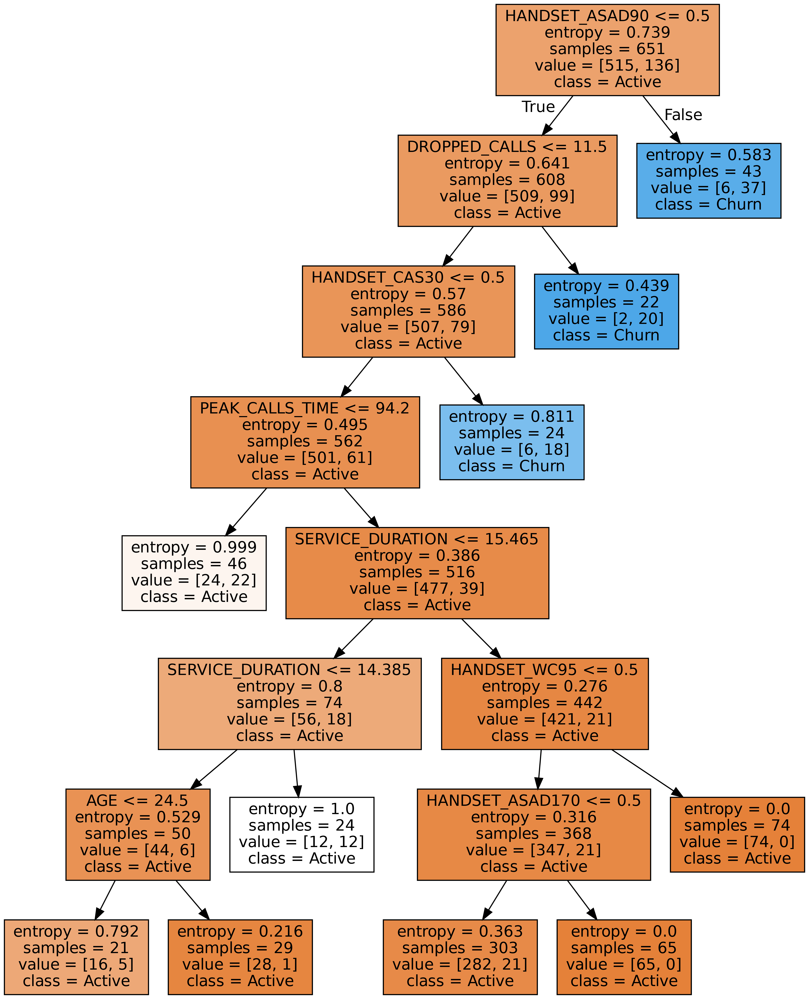

In [78]:
call(['dot', '-Tpng', 'tree_final2.dot', '-o', 'tree_final2.png', '-Gdpi=600'])
Image(filename = 'tree_final2.png')

In [79]:
y_pred = tree_final.predict(df_test_x)
print("Accuracy: {0:.3f}\n".format(tree_final.score(df_test_x, df_test_y)))
print("Confusion matrix: \n{}".format(confusion_matrix(df_test_y, y_pred)))

print(classification_report(df_test_y, y_pred, digits=3))

Accuracy: 0.914

Confusion matrix: 
[[228   7]
 [ 17  27]]
              precision    recall  f1-score   support

           0      0.931     0.970     0.950       235
           1      0.794     0.614     0.692        44

    accuracy                          0.914       279
   macro avg      0.862     0.792     0.821       279
weighted avg      0.909     0.914     0.909       279



#### 설명변수 중요도
* Importance는 상대적인 값
* Importance = 0 -> 적용 모델의 가지 분리시 해당 변수가 사용되지 않았다는 의미->다른 모델 생성 시에는 변경될 수 있음!!

In [80]:
df_importance = pd.DataFrame()
df_importance["Feature"] = v_feature_name
df_importance["Importance"] = tree_final.feature_importances_

df_importance.sort_values("Importance", ascending=False, inplace = True)
df_importance.round(3)

,Feature,Importance
17,HANDSET_ASAD90,0.402
2,DROPPED_CALLS,0.262
20,HANDSET_CAS30,0.195
4,PEAK_CALLS_TIME,0.141
25,HANDSET_SOP20,0.000
19,HANDSET_BS210,0.000
21,HANDSET_CAS60,0.000
22,HANDSET_S50,0.000
23,HANDSET_S80,0.000
24,HANDSET_SOP10,0.000


### @추가연습:Over-sampling Data이용한 모델링 및 평가

#### Over-Sampling 데이터 분할-> 모델 비교

* SMOTE Over-Sampling에 따라 선택되는 데이터가 다를 수 있어

In [81]:
df_train_x_over, df_test_x_over, df_train_y_over, df_test_y_over = train_test_split(
    x_resampled, y_resampled, test_size = 0.3, stratify=y_resampled, random_state = 1234) 

print("분할 전 데이터 현황... 설명:", x_resampled.shape, "  목표:", y_resampled.shape)
print("분할 후 설명변수 현황...Train:", df_train_x_over.shape, " Test:", df_test_x_over.shape)
print("분할 후 목표변수 현황...Train:", df_train_y_over.value_counts(), " Test:", df_test_y_over.value_counts())

분할 전 데이터 현황... 설명: (1030, 33)   목표: (1030,)
분할 후 설명변수 현황...Train: (721, 33)  Test: (309, 33)
분할 후 목표변수 현황...Train: 0    361
1    360
Name: CHURN, dtype: int64  Test: 1    155
0    154
Name: CHURN, dtype: int64


In [83]:
tree_final_over = DecisionTreeClassifier(max_depth=7, min_samples_split=50, min_samples_leaf=14, random_state=1234)

tree_final_over.fit(df_train_x_over, df_train_y_over)

DecisionTreeClassifier(max_depth=7, min_samples_leaf=14, min_samples_split=50,
                       random_state=1234)

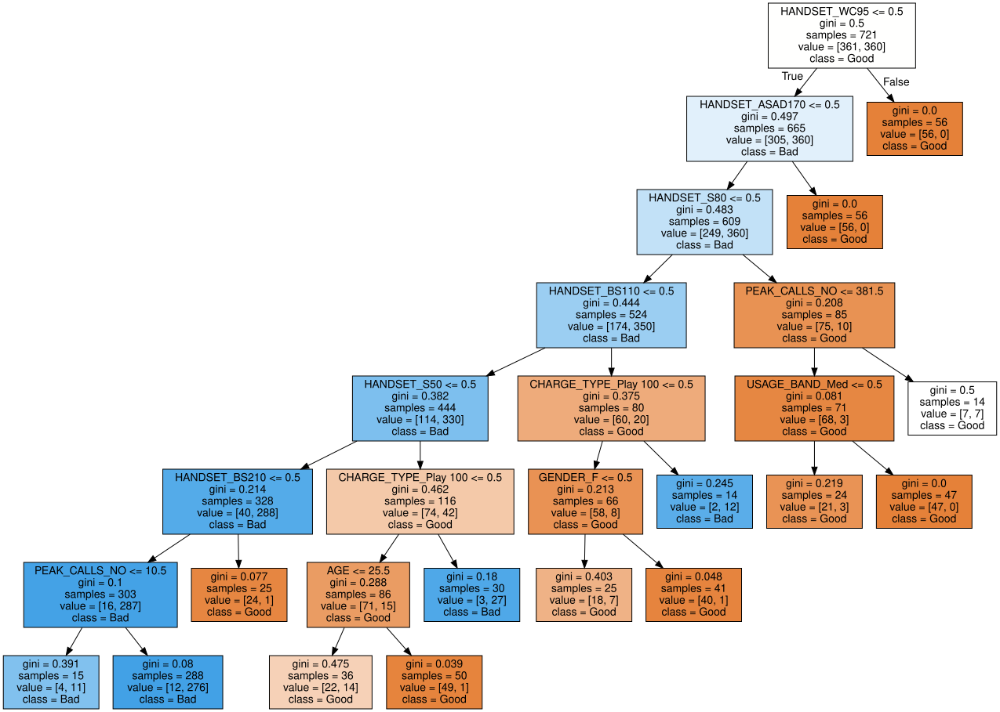

In [84]:
export_graphviz(tree_final_over, out_file="tree_final_over.dot", class_names = ["Good", "Bad"],
                feature_names = v_feature_name, impurity = True, filled = True)

with open("tree_final_over.dot") as f:
    dot_graph = f.read()
display(graphviz.Source(dot_graph))

### ...다른 방식의 Tree 시각화(이미지가 큰 경우)

In [87]:
all(['dot', '-Tpng', 'tree_final_over.dot', '-o', 'tree_final_over.png', '-Gdpi=600'])

Image(filename = 'tree_final_over.png')

In [88]:
y_pred_over = tree_final_over.predict(df_test_x_over)
print("Test Accuracy: {0:.3f}\n".format(tree_final_over.score(df_test_x_over, df_test_y_over)))
print("Test Confusion matrix: \n{}".format(confusion_matrix(df_test_y_over, y_pred_over)))

print(classification_report(df_test_y_over, y_pred_over, digits=3))

Test Accuracy: 0.903

Test Confusion matrix: 
[[144  10]
 [ 20 135]]
              precision    recall  f1-score   support

           0      0.878     0.935     0.906       154
           1      0.931     0.871     0.900       155

    accuracy                          0.903       309
   macro avg      0.905     0.903     0.903       309
weighted avg      0.905     0.903     0.903       309



In [89]:
df_importance = pd.DataFrame()
df_importance["Feature"] = v_feature_name
df_importance["Importance"] = tree_final_over.feature_importances_

df_importance.sort_values("Importance", ascending=False, inplace = True)
df_importance.round(3)

,Feature,Importance
22,HANDSET_S50,0.164
23,HANDSET_S80,0.160
19,HANDSET_BS210,0.137
14,CHARGE_TYPE_Play 100,0.129
16,HANDSET_ASAD170,0.129
18,HANDSET_BS110,0.119
26,HANDSET_WC95,0.109
3,PEAK_CALLS_NO,0.023
0,AGE,0.021
9,GENDER_F,0.007


Text(0, 0.5, '설명변수')

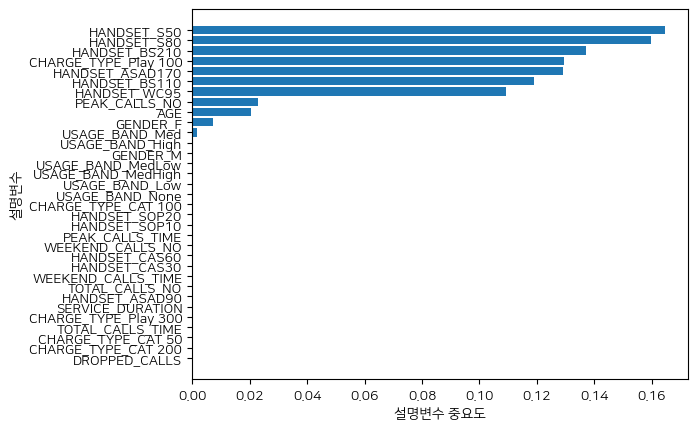

In [90]:
df_importance.sort_values("Importance", ascending=True, inplace = True)
coordinates = range(len(df_importance))
plt.barh(y = coordinates, width = df_importance["Importance"])
plt.yticks(coordinates, df_importance["Feature"])
plt.xlabel("설명변수 중요도")
plt.ylabel("설명변수")

## Grid Search
* Tree 모델의 hyper-parameter의 최적값 탐색
* grid(값의 격자) 방식으로 값을 변경/조합하면서 모델의 성능 비교
* 반복 모델 생성시 CV(cross-validation) 방식으로 data 선택 -> 개별 모델과 최적값이 다를 수 있음  

##### @해석 : 선정된 hyper-parameter가 타당(?) 하지 않을 수 있음

* 분석가 모델 조건 : 
        class_weight=None, criterion='gini', max_depth=4,
        max_features=None, max_leaf_nodes=None,
        min_impurity_decrease=0.0, min_impurity_split=None,
        min_samples_leaf=8, min_samples_split=20,
        min_weight_fraction_leaf=0.0, presort=False, random_state=1234,
        splitter='best')

## End of 의사결정나무